<a href="https://colab.research.google.com/github/iljimae13/Pengelolaan-Citra/blob/main/Chapter15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saving 20230403_125208-removebg.png to 20230403_125208-removebg.png


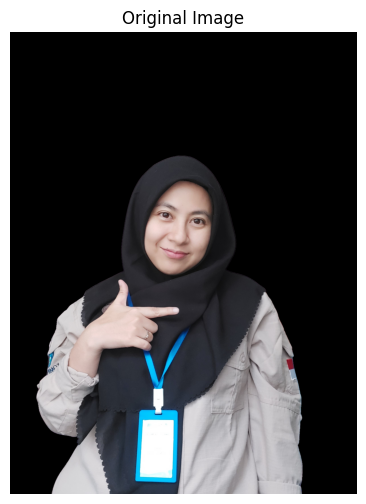

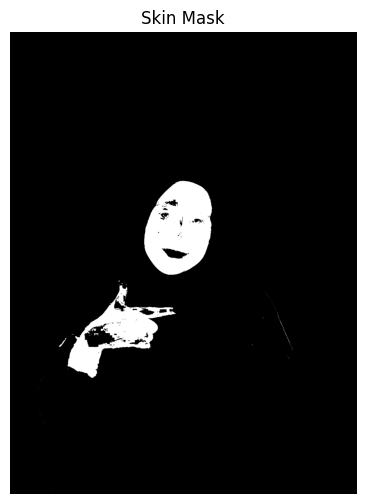

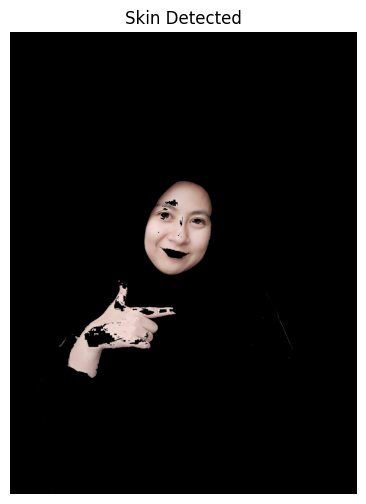

In [1]:
# Install OpenCV jika belum tersedia
!pip install opencv-python-headless numpy matplotlib

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk memvisualisasikan gambar
def show_image(img, title="Image", cmap_type="gray"):
    plt.figure(figsize=(8, 6))
    if cmap_type == "gray":
        plt.imshow(img, cmap=cmap_type)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Upload gambar atau gunakan gambar dari URL
from google.colab import files
uploaded = files.upload()

# Baca gambar dari file yang diunggah
image_path = list(uploaded.keys())[0]  # Ambil nama file yang diunggah
image = cv2.imread(image_path)
show_image(image, title="Original Image", cmap_type=None)

# Konversi gambar ke ruang warna HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Definisikan rentang warna kulit dalam ruang warna HSV
lower_skin = np.array([0, 30, 60], dtype=np.uint8)
upper_skin = np.array([20, 150, 255], dtype=np.uint8)

# Masking untuk mendeteksi warna kulit
skin_mask = cv2.inRange(hsv_image, lower_skin, upper_skin)

# Terapkan masking ke gambar asli
skin_detected = cv2.bitwise_and(image, image, mask=skin_mask)

# Visualisasi hasil
show_image(skin_mask, title="Skin Mask", cmap_type="gray")
show_image(skin_detected, title="Skin Detected", cmap_type=None)


Saving bg-itb.jpg to bg-itb.jpg


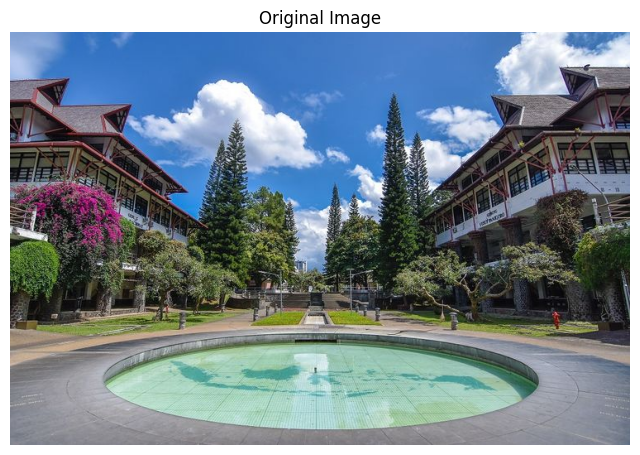

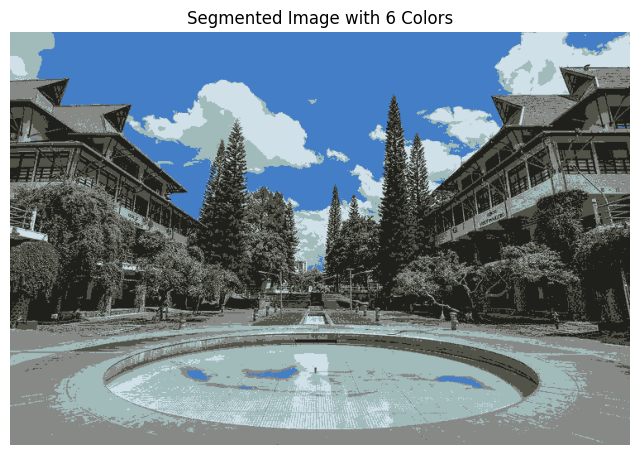

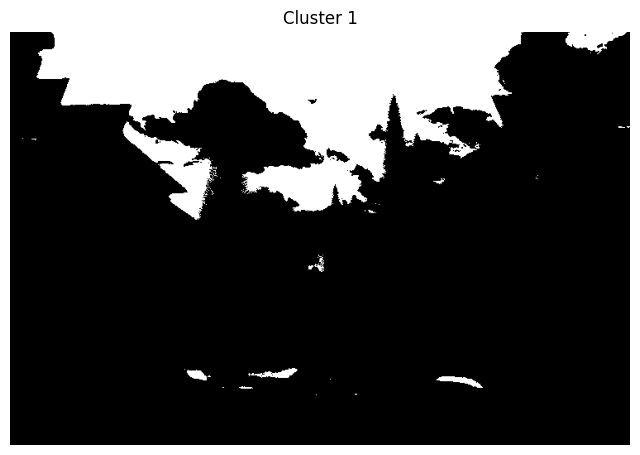

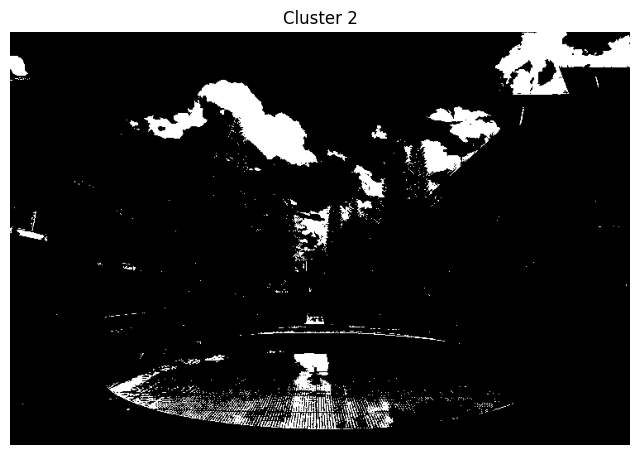

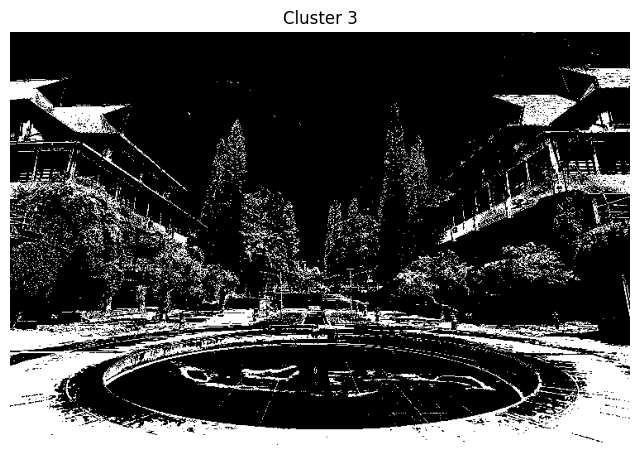

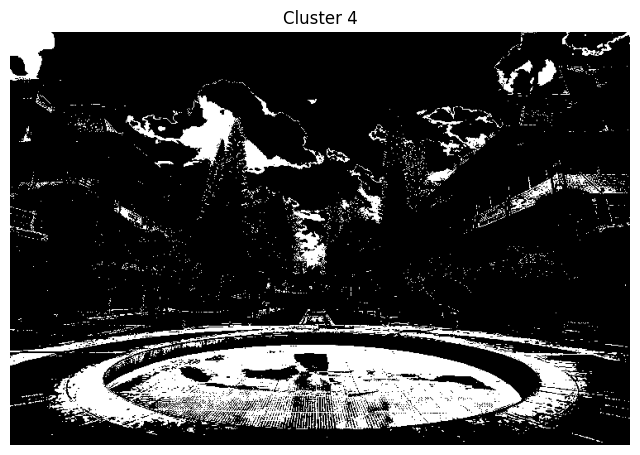

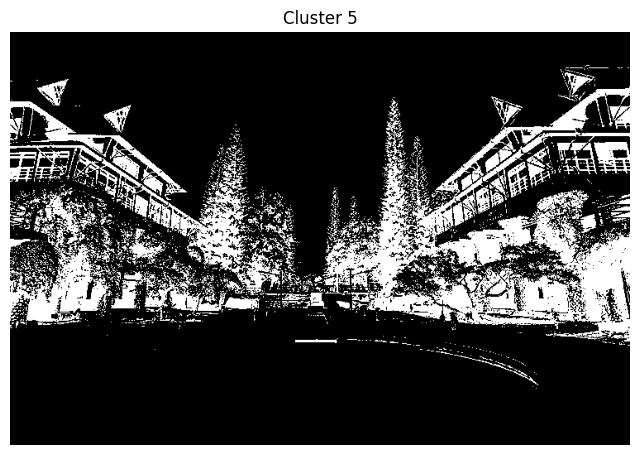

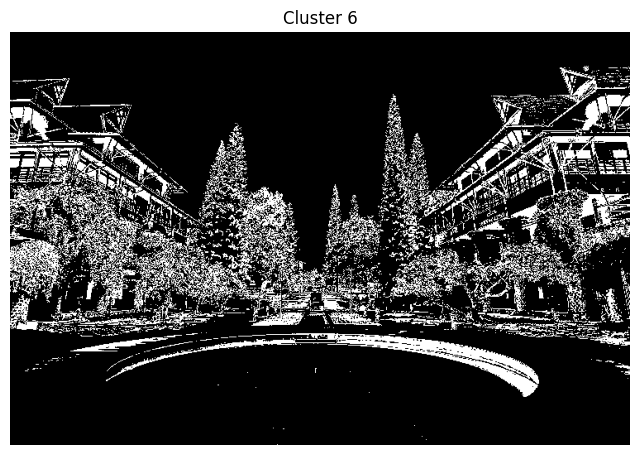

In [3]:
# Install OpenCV, Matplotlib, dan NumPy jika belum ada
!pip install opencv-python-headless numpy matplotlib

# Import library yang diperlukan
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_image(img, title="Image", cmap_type=None):
    plt.figure(figsize=(8, 6))
    if cmap_type:
        plt.imshow(img, cmap=cmap_type)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

# Upload gambar ke Google Colab
from google.colab import files
uploaded = files.upload()

# Membaca gambar yang diunggah
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
show_image(image, title="Original Image")

# Konversi gambar ke bentuk array dua dimensi
pixels = image.reshape((-1, 3))  # Bentuknya menjadi (total_pixels, 3)
pixels = np.float32(pixels)  # Konversi ke float32 agar bisa digunakan di K-Means

# Parameter K-Means
k = 6  # Jumlah cluster warna
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Menjalankan algoritma K-Means
_, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Mengonversi kembali cluster center ke uint8 (warna 8-bit)
centers = np.uint8(centers)

# Map setiap pixel ke warna centroid sesuai dengan label
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image.shape)

# Visualisasi hasil segmentasi
show_image(segmented_image, title=f"Segmented Image with {k} Colors")

# Opsional: Menampilkan setiap cluster warna secara terpisah
for i in range(k):
    mask = (labels.flatten() == i)
    cluster = np.zeros_like(pixels)
    cluster[mask] = centers[i]
    cluster_image = cluster.reshape(image.shape)
    show_image(cluster_image, title=f"Cluster {i + 1}")


Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20.jpeg


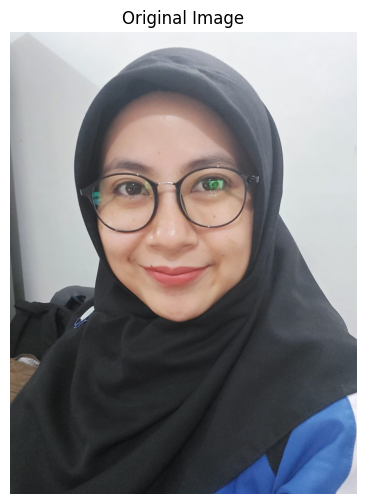

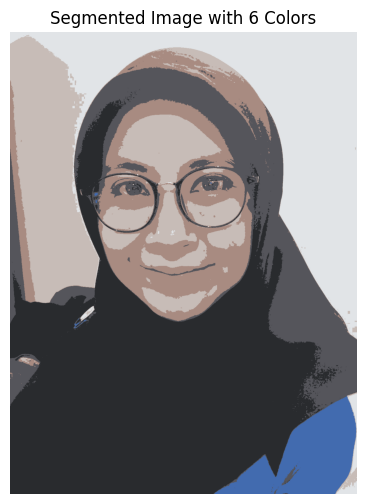

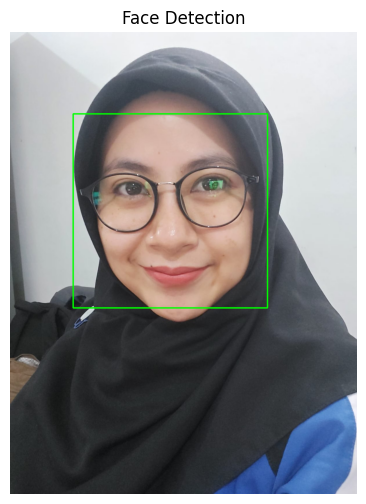

In [4]:
# Install library jika diperlukan
!pip install opencv-python-headless numpy matplotlib

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_image(img, title="Image", cmap_type=None):
    plt.figure(figsize=(8, 6))
    if cmap_type:
        plt.imshow(img, cmap=cmap_type)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

# Upload gambar ke Colab
from google.colab import files
uploaded = files.upload()

# Membaca gambar yang diunggah
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
show_image(image, title="Original Image")

### Bagian 1: Segmentasi Warna dengan K-Means Clustering ###
# Konversi gambar ke array 2D
pixels = image.reshape((-1, 3))  # Bentuk menjadi (total_pixels, 3)
pixels = np.float32(pixels)  # Ubah tipe data ke float32

# Parameter K-Means
k = 6  # Jumlah cluster
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Menjalankan K-Means
_, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Rekonstruksi gambar hasil segmentasi
centers = np.uint8(centers)
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image.shape)

# Menampilkan gambar hasil segmentasi
show_image(segmented_image, title=f"Segmented Image with {k} Colors")

### Bagian 2: Deteksi Wajah Menggunakan Haar Cascade ###
# Konversi gambar ke grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Load pre-trained Haar cascade untuk deteksi wajah
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Gambar kotak di sekitar wajah yang terdeteksi
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 3)

# Menampilkan hasil deteksi wajah
show_image(image, title="Face Detection")


Saving bg-itb.jpg to bg-itb (1).jpg


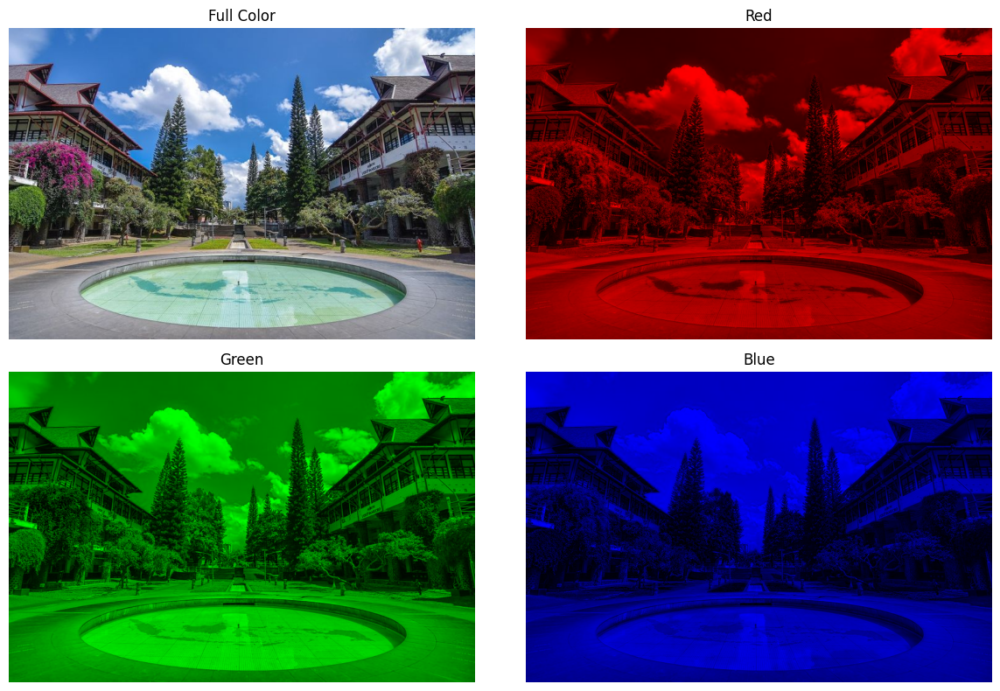

In [5]:
# Install library jika belum ada
!pip install opencv-python-headless numpy matplotlib

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(12, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 2, i + 1)
        if cmap_type and title != "Full Color":
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar ke Colab
from google.colab import files
uploaded = files.upload()

# Membaca gambar yang diunggah
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Ekstraksi channel warna
b, g, r = cv2.split(image)

# Membuat gambar channel warna
red_image = np.zeros_like(image)
red_image[:, :, 2] = r  # Channel Red

green_image = np.zeros_like(image)
green_image[:, :, 1] = g  # Channel Green

blue_image = np.zeros_like(image)
blue_image[:, :, 0] = b  # Channel Blue

# Menampilkan hasil
images = [image, red_image, green_image, blue_image]
titles = ["Full Color", "Red", "Green", "Blue"]
show_images(images, titles)


Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20 (1).jpeg


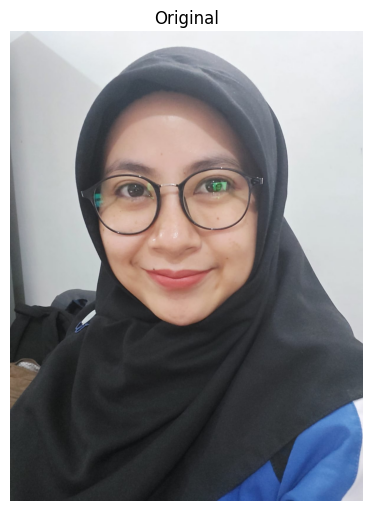

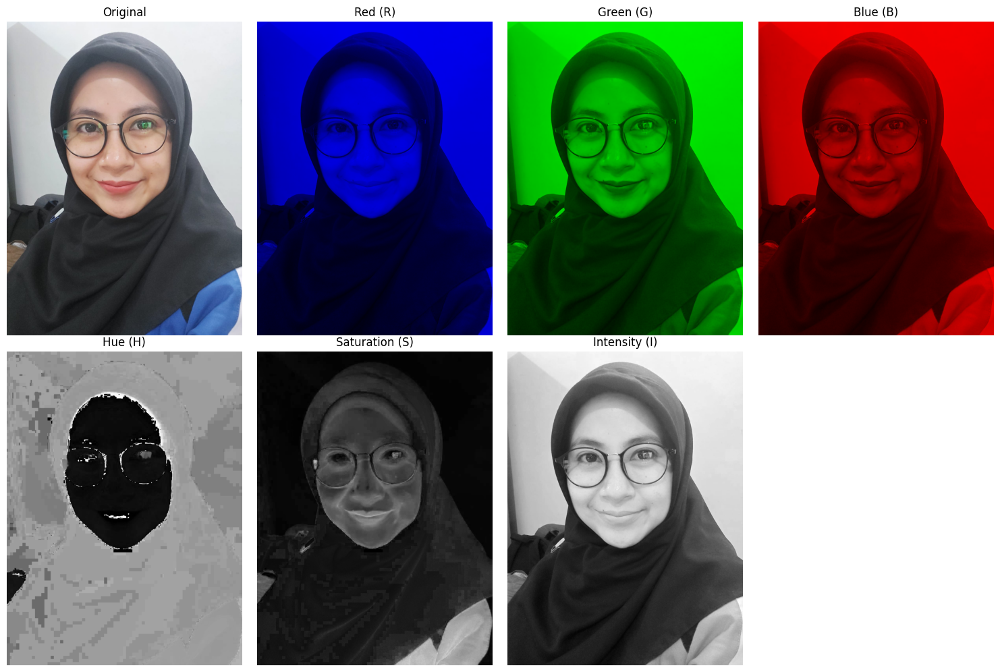

In [6]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 10))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        if cmap_type and title not in ["Original"]:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar yang diunggah
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
show_images([image], ["Original"])  # Tampilkan gambar asli

# **1. Pisahkan Channel RGB**
b, g, r = cv2.split(image)

# Gabungkan channel untuk visualisasi intensitas tiap channel
red_channel = np.zeros_like(image)
red_channel[:, :, 2] = r  # Red

green_channel = np.zeros_like(image)
green_channel[:, :, 1] = g  # Green

blue_channel = np.zeros_like(image)
blue_channel[:, :, 0] = b  # Blue

# **2. Konversi ke Ruang Warna HSI**
hsi_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, i = cv2.split(hsi_image)  # Hue, Saturation, Intensity

# Normalisasi channel Hue, Saturation, Intensity untuk visualisasi
h_normalized = cv2.normalize(h, None, 0, 255, cv2.NORM_MINMAX)
s_normalized = cv2.normalize(s, None, 0, 255, cv2.NORM_MINMAX)
i_normalized = cv2.normalize(i, None, 0, 255, cv2.NORM_MINMAX)

# **3. Visualisasi Semua Channel**
images = [
    image, red_channel, green_channel, blue_channel,
    h_normalized, s_normalized, i
]
titles = [
    "Original", "Red (R)", "Green (G)", "Blue (B)",
    "Hue (H)", "Saturation (S)", "Intensity (I)"
]
show_images(images, titles, cmap_type="gray")


Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20 (2).jpeg


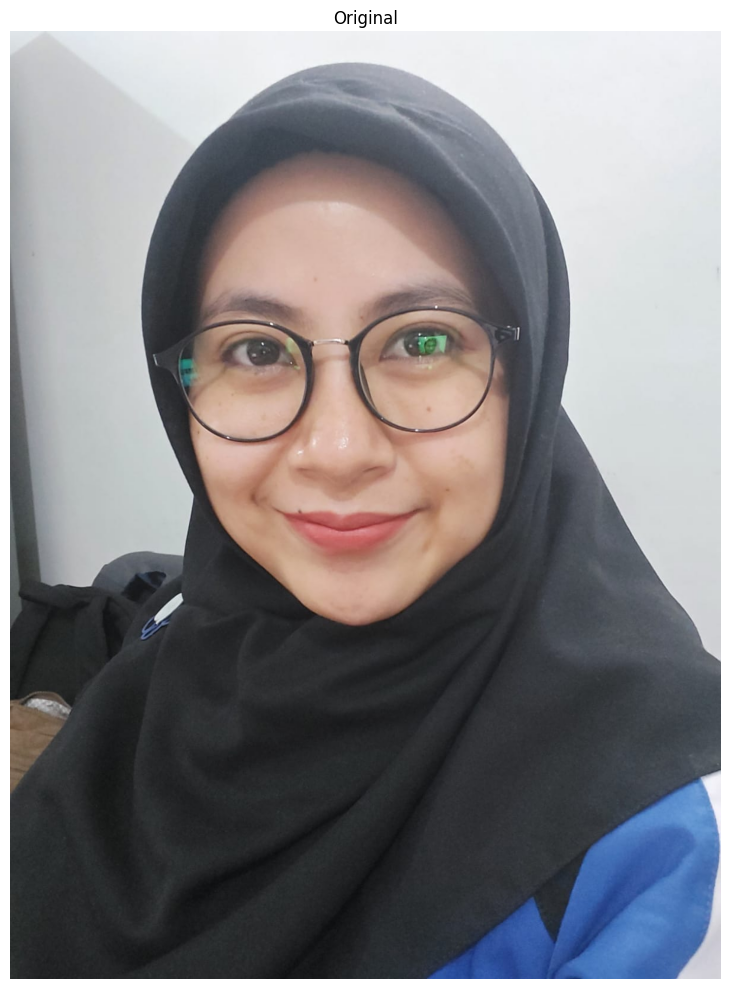

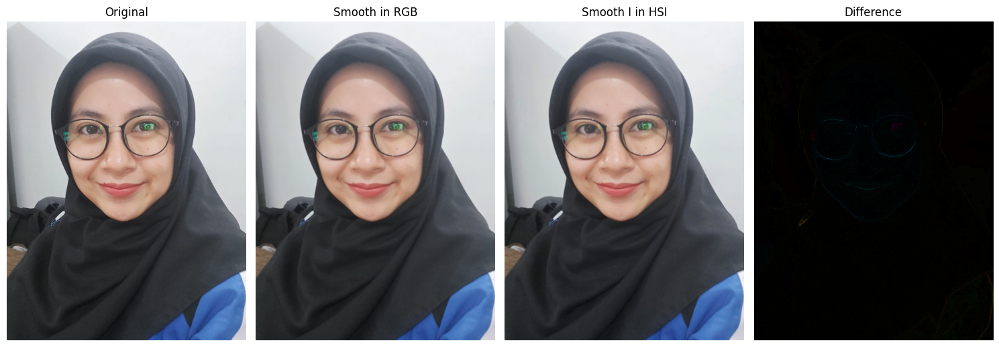

In [7]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 10))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if cmap_type and title != "Original":
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar ke Colab
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Tampilkan gambar asli
show_images([image], ["Original"])

# **1. Penapisan Rata-rata di Ruang RGB**
smoothed_rgb = cv2.blur(image, (5, 5))  # Filter rata-rata 5x5

# **2. Penapisan pada Intensitas di Ruang HSI**
# Konversi gambar ke HSI (HSV pada OpenCV)
hsi_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, i = cv2.split(hsi_image)

# Terapkan penapisan rata-rata hanya pada channel Intensity
smoothed_i = cv2.blur(i, (5, 5))

# Gabungkan kembali HSI dengan intensitas yang telah difilter
smoothed_hsi = cv2.merge((h, s, smoothed_i))
smoothed_hsi_rgb = cv2.cvtColor(smoothed_hsi, cv2.COLOR_HSV2BGR)

# **3. Hitung Perbedaan**
# Konversi gambar ke float untuk menghindari overflow saat menghitung perbedaan
diff = cv2.absdiff(smoothed_rgb.astype("float32"), smoothed_hsi_rgb.astype("float32"))
diff = cv2.normalize(diff, None, 0, 255, cv2.NORM_MINMAX).astype("uint8")  # Normalisasi ke 0-255

# **4. Tampilkan Hasil**
images = [image, smoothed_rgb, smoothed_hsi_rgb, diff]
titles = ["Original", "Smooth in RGB", "Smooth I in HSI", "Difference"]
show_images(images, titles)


Saving man-of-steel-6.jpg to man-of-steel-6.jpg


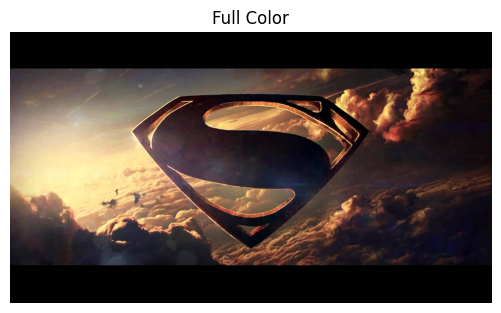

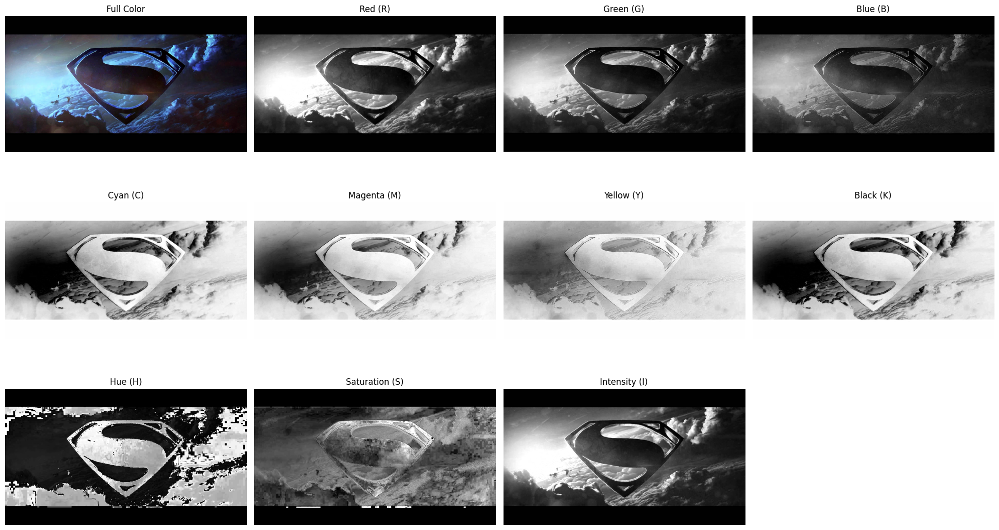

In [8]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(20, 15))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(4, 4, i + 1)
        if cmap_type:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
show_images([image], ["Full Color"])  # Tampilkan gambar asli

### **1. Channel RGB** ###
b, g, r = cv2.split(image)

# Normalisasi untuk visualisasi grayscale
r_norm = cv2.normalize(r, None, 0, 255, cv2.NORM_MINMAX)
g_norm = cv2.normalize(g, None, 0, 255, cv2.NORM_MINMAX)
b_norm = cv2.normalize(b, None, 0, 255, cv2.NORM_MINMAX)

### **2. Channel CMY(K)** ###
# Konversi ke CMY
c = 255 - r
m = 255 - g
y = 255 - b

# Konversi ke CMYK
k = np.minimum(c, np.minimum(m, y))

# Normalisasi untuk visualisasi grayscale
c_norm = cv2.normalize(c, None, 0, 255, cv2.NORM_MINMAX)
m_norm = cv2.normalize(m, None, 0, 255, cv2.NORM_MINMAX)
y_norm = cv2.normalize(y, None, 0, 255, cv2.NORM_MINMAX)
k_norm = cv2.normalize(k, None, 0, 255, cv2.NORM_MINMAX)

### **3. Channel HSI (HSV)** ###
# Konversi ke ruang warna HSV
hsi_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h, s, i = cv2.split(hsi_image)

# Normalisasi untuk visualisasi grayscale
h_norm = cv2.normalize(h, None, 0, 255, cv2.NORM_MINMAX)
s_norm = cv2.normalize(s, None, 0, 255, cv2.NORM_MINMAX)
i_norm = cv2.normalize(i, None, 0, 255, cv2.NORM_MINMAX)

### **4. Visualisasi Semua Channel** ###
images = [
    image, r_norm, g_norm, b_norm,  # RGB
    c_norm, m_norm, y_norm, k_norm,  # CMYK
    h_norm, s_norm, i_norm  # HSI
]
titles = [
    "Full Color", "Red (R)", "Green (G)", "Blue (B)",  # RGB
    "Cyan (C)", "Magenta (M)", "Yellow (Y)", "Black (K)",  # CMYK
    "Hue (H)", "Saturation (S)", "Intensity (I)"  # HSI
]
show_images(images, titles, cmap_type="gray")


Saving Leni Fitriani.jpeg to Leni Fitriani.jpeg


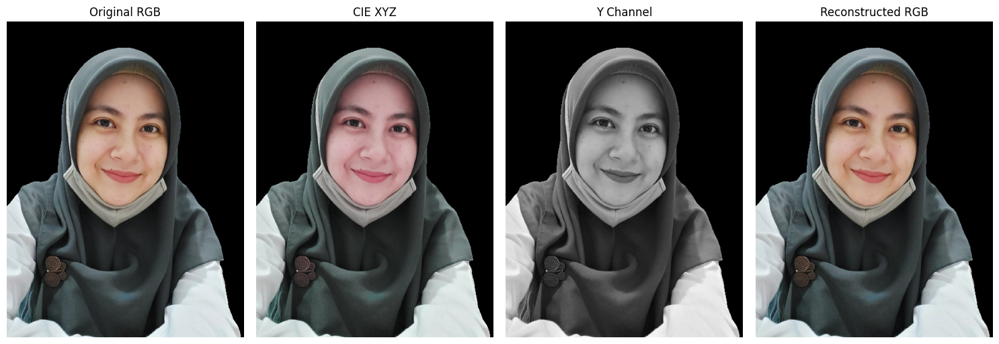

In [9]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles):
    plt.figure(figsize=(15, 5))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if len(img.shape) == 2:  # Grayscale
            plt.imshow(img, cmap='gray')
        else:  # RGB
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Fungsi untuk konversi RGB ke CIE XYZ
def rgb_to_xyz(image):
    # Normalisasi RGB ke [0, 1]
    rgb = image / 255.0
    # Matriks transformasi RGB ke XYZ
    transform_matrix = np.array([
        [0.490, 0.310, 0.200],
        [0.177, 0.813, 0.011],
        [0.000, 0.010, 0.990]
    ])
    # Transformasi
    xyz = np.dot(rgb.reshape(-1, 3), transform_matrix.T)
    xyz = np.clip(xyz, 0, 1)  # Pastikan hasil dalam rentang [0, 1]
    return (xyz * 255).reshape(image.shape).astype(np.uint8)

# Fungsi untuk konversi CIE XYZ ke RGB
def xyz_to_rgb(xyz_image):
    # Normalisasi XYZ ke [0, 1]
    xyz = xyz_image / 255.0
    # Matriks transformasi XYZ ke RGB
    transform_matrix = np.array([
        [2.365, -0.896, -0.468],
        [-0.515, 1.425, 0.088],
        [0.005, -0.014, 1.009]
    ])
    # Transformasi
    rgb = np.dot(xyz.reshape(-1, 3), transform_matrix.T)
    rgb = np.clip(rgb, 0, 1)  # Pastikan hasil dalam rentang [0, 1]
    return (rgb * 255).reshape(xyz_image.shape).astype(np.uint8)

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Konversi dari RGB ke CIE XYZ
xyz_image = rgb_to_xyz(image)

# Ekstrak channel Y dari CIE XYZ
y_channel = xyz_image[:, :, 1]

# Konversi kembali dari CIE XYZ ke RGB
reconstructed_rgb = xyz_to_rgb(xyz_image)

# Tampilkan hasil
images = [image, xyz_image, y_channel, reconstructed_rgb]
titles = ["Original RGB", "CIE XYZ", "Y Channel", "Reconstructed RGB"]
show_images(images, titles)


Saving 20230403_125208-removebg.png to 20230403_125208-removebg (1).png


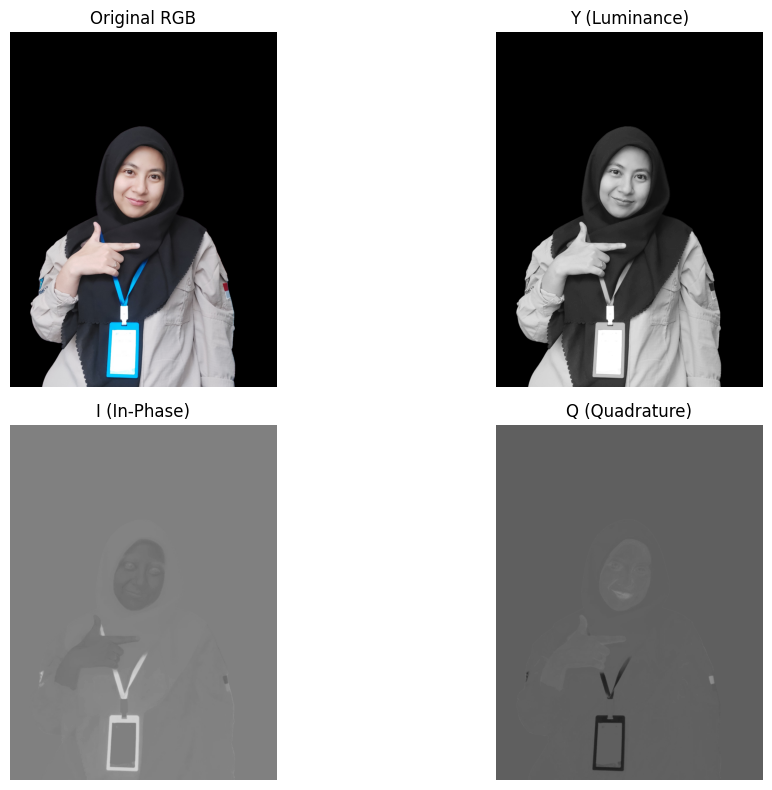

In [10]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type='gray'):
    plt.figure(figsize=(12, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 2, i + 1)
        plt.imshow(img, cmap=cmap_type)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Fungsi untuk konversi RGB ke YIQ
def rgb_to_yiq(image):
    # Normalisasi RGB ke [0, 1]
    rgb = image / 255.0
    # Matriks transformasi RGB ke YIQ
    transform_matrix = np.array([
        [0.299, 0.587, 0.114],
        [0.595, -0.274, -0.321],
        [0.211, -0.523, 0.312]
    ])
    # Transformasi
    yiq = np.dot(rgb.reshape(-1, 3), transform_matrix.T)
    return yiq.reshape(image.shape)

# Fungsi untuk memisahkan channel YIQ
def extract_yiq_channels(yiq_image):
    # Ekstrak channel Y, I, Q
    y = yiq_image[:, :, 0]
    i = yiq_image[:, :, 1]
    q = yiq_image[:, :, 2]
    return y, i, q

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Konversi dari RGB ke YIQ
yiq_image = rgb_to_yiq(image)

# Ekstrak channel Y, I, Q
y_channel, i_channel, q_channel = extract_yiq_channels(yiq_image)

# Normalisasi untuk visualisasi
y_channel_normalized = cv2.normalize(y_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
i_channel_normalized = cv2.normalize(i_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
q_channel_normalized = cv2.normalize(q_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Tampilkan gambar
images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB), y_channel_normalized, i_channel_normalized, q_channel_normalized]
titles = ["Original RGB", "Y (Luminance)", "I (In-Phase)", "Q (Quadrature)"]
show_images(images, titles)


Saving Leni Fitriani.jpeg to Leni Fitriani (1).jpeg


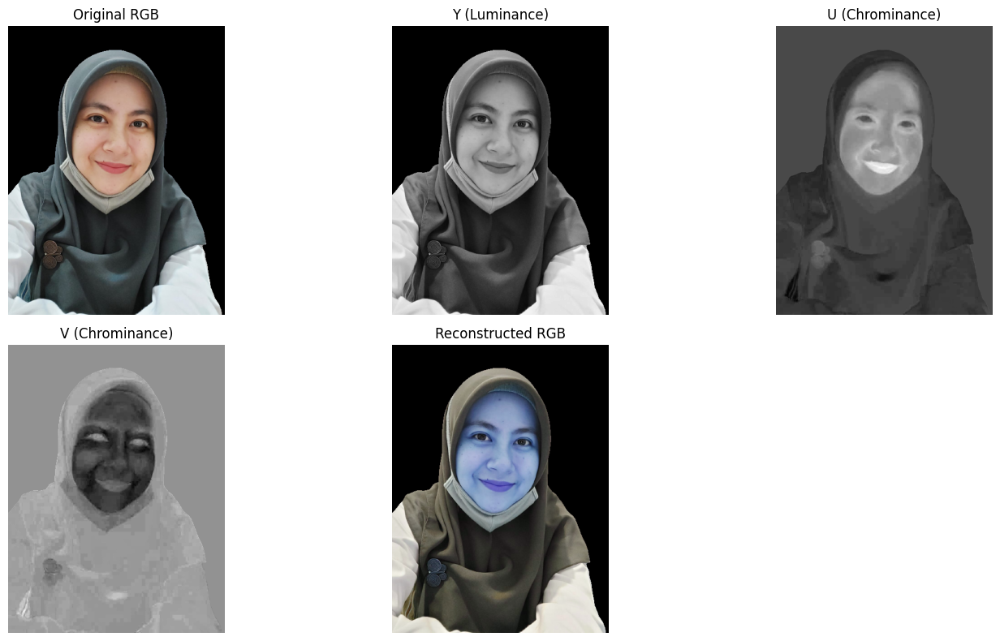

In [11]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 3, i + 1)
        if cmap_type:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Fungsi untuk konversi RGB ke YUV
def rgb_to_yuv(image):
    # Normalisasi RGB ke [0, 1]
    rgb = image / 255.0
    # Matriks transformasi RGB ke YUV
    transform_matrix = np.array([
        [0.299, 0.587, 0.114],
        [-0.147, -0.289, 0.436],
        [0.615, -0.515, -0.100]
    ])
    # Transformasi
    yuv = np.dot(rgb.reshape(-1, 3), transform_matrix.T)
    return yuv.reshape(image.shape)

# Fungsi untuk konversi YUV ke RGB
def yuv_to_rgb(yuv_image):
    # Matriks transformasi YUV ke RGB
    transform_matrix = np.array([
        [1.000, 0.000, 1.140],
        [1.000, -0.395, -0.581],
        [1.000, 2.032, 0.000]
    ])
    # Transformasi
    rgb = np.dot(yuv_image.reshape(-1, 3), transform_matrix.T)
    rgb = np.clip(rgb, 0, 1)  # Pastikan hasil dalam rentang [0, 1]
    return (rgb * 255).reshape(yuv_image.shape).astype(np.uint8)

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Konversi dari RGB ke YUV
yuv_image = rgb_to_yuv(image)

# Ekstrak channel Y, U, V
y_channel = yuv_image[:, :, 0]
u_channel = yuv_image[:, :, 1]
v_channel = yuv_image[:, :, 2]

# Normalisasi untuk visualisasi
y_channel_norm = cv2.normalize(y_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
u_channel_norm = cv2.normalize(u_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
v_channel_norm = cv2.normalize(v_channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Konversi kembali dari YUV ke RGB
reconstructed_rgb = yuv_to_rgb(yuv_image)

# Visualisasi
images = [
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB), y_channel_norm, u_channel_norm, v_channel_norm, reconstructed_rgb
]
titles = ["Original RGB", "Y (Luminance)", "U (Chrominance)", "V (Chrominance)", "Reconstructed RGB"]
show_images(images, titles, cmap_type="gray")


Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20 (4).jpeg


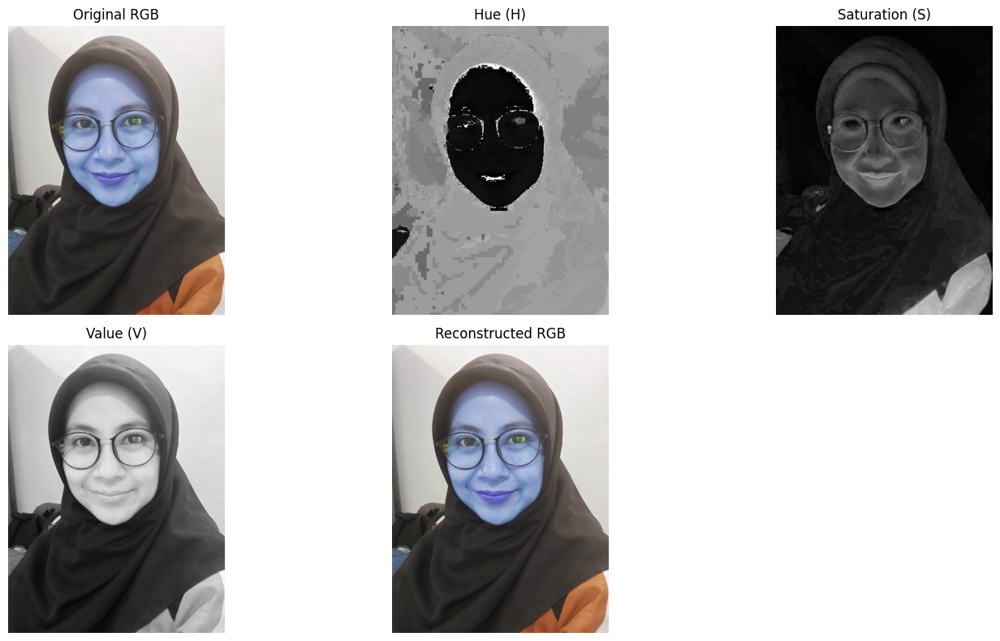

In [14]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 3, i + 1)
        if cmap_type and title != "Original RGB":
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Fungsi untuk konversi RGB ke HSV
def rgb_to_hsv(image):
    image = image / 255.0  # Normalisasi RGB ke [0, 1]
    R, G, B = image[..., 2], image[..., 1], image[..., 0]  # OpenCV format BGR
    V = np.max(image, axis=-1)  # Komponen V
    Vm = V - np.min(image, axis=-1)  # Vm = V - min(R, G, B)
    S = np.where(V != 0, Vm / V, 0)  # Komponen S

    H = np.zeros_like(V)
    mask = Vm > 0  # Mask untuk menghindari pembagian dengan 0

    # Hitung H untuk setiap kasus
    idx = (V == R) & mask
    H[idx] = (60 * (G[idx] - B[idx]) / Vm[idx]) % 360

    idx = (V == G) & mask
    H[idx] = (60 * (2 + (B[idx] - R[idx]) / Vm[idx]))

    idx = (V == B) & mask
    H[idx] = (60 * (4 + (R[idx] - G[idx]) / Vm[idx]))

    H = np.where(H < 0, H + 360, H)  # Pastikan H positif
    return np.stack([H, S, V], axis=-1)

# Fungsi untuk konversi HSV ke RGB
def hsv_to_rgb(hsv):
    H, S, V = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    C = V * S
    X = C * (1 - np.abs((H / 60) % 2 - 1))
    m = V - C

    R, G, B = np.zeros_like(H), np.zeros_like(H), np.zeros_like(H)
    h_category = (H // 60).astype(int) % 6

    # Tentukan nilai RGB berdasarkan kategori H
    R[h_category == 0], G[h_category == 0], B[h_category == 0] = C[h_category == 0], X[h_category == 0], 0
    R[h_category == 1], G[h_category == 1], B[h_category == 1] = X[h_category == 1], C[h_category == 1], 0
    R[h_category == 2], G[h_category == 2], B[h_category == 2] = 0, C[h_category == 2], X[h_category == 2]
    R[h_category == 3], G[h_category == 3], B[h_category == 3] = 0, X[h_category == 3], C[h_category == 3]
    R[h_category == 4], G[h_category == 4], B[h_category == 4] = X[h_category == 4], 0, C[h_category == 4]
    R[h_category == 5], G[h_category == 5], B[h_category == 5] = C[h_category == 5], 0, X[h_category == 5]

    R, G, B = (R + m), (G + m), (B + m)
    return (np.stack([B, G, R], axis=-1) * 255).astype(np.uint8)

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Konversi dari RGB ke HSV
hsv_image = rgb_to_hsv(image)

# Ekstrak channel H, S, V
H_channel, S_channel, V_channel = hsv_image[..., 0], hsv_image[..., 1], hsv_image[..., 2]

# Normalisasi untuk visualisasi
H_channel_norm = (H_channel / 360 * 255).astype(np.uint8)
S_channel_norm = (S_channel * 255).astype(np.uint8)
V_channel_norm = (V_channel * 255).astype(np.uint8)

# Konversi kembali dari HSV ke RGB
reconstructed_rgb = hsv_to_rgb(hsv_image)

# Visualisasi
images = [
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB), H_channel_norm, S_channel_norm, V_channel_norm, reconstructed_rgb
]
titles = ["Original RGB", "Hue (H)", "Saturation (S)", "Value (V)", "Reconstructed RGB"]
show_images(images, titles, cmap_type="gray")


Saving image-removebg-preview (3).png to image-removebg-preview (3).png


ValueError: num must be an integer with 1 <= num <= 6, not 7

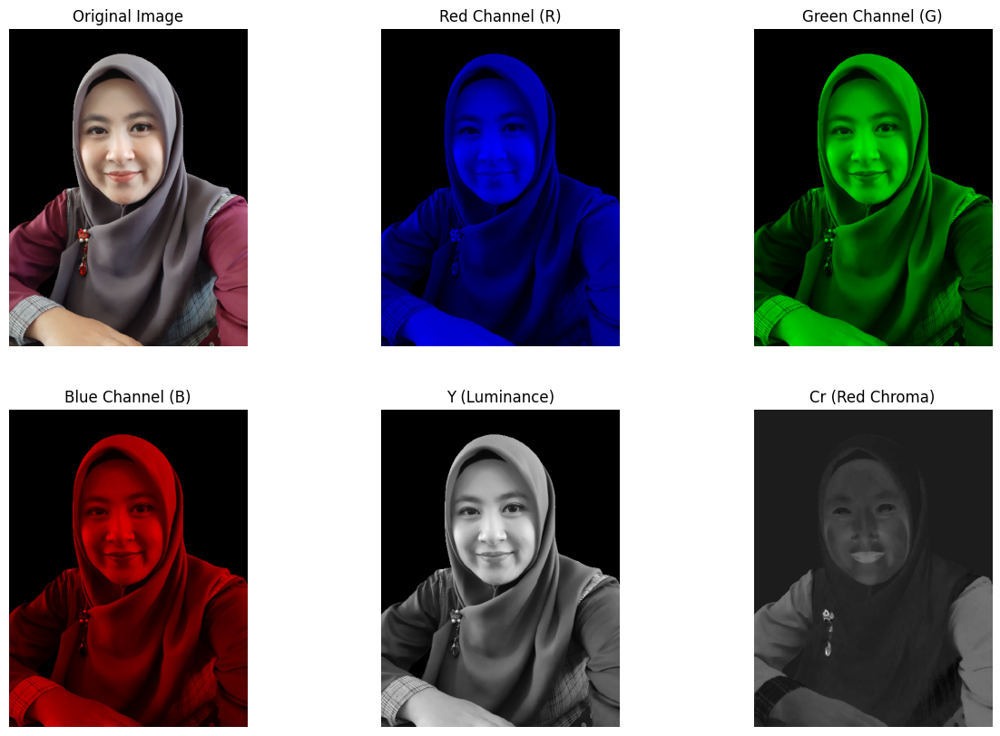

In [15]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 10))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 3, i + 1)
        if cmap_type:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# **1. Pisahkan Komponen RGB**
b, g, r = cv2.split(image)

# Buat gambar untuk menampilkan warna dominan per channel
red_channel = np.zeros_like(image)
red_channel[:, :, 2] = r

green_channel = np.zeros_like(image)
green_channel[:, :, 1] = g

blue_channel = np.zeros_like(image)
blue_channel[:, :, 0] = b

# **2. Konversi ke Ruang Warna YCrCb**
ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
y, cr, cb = cv2.split(ycrcb_image)

# **3. Visualisasi**
images = [
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB),  # Original
    red_channel, green_channel, blue_channel,  # RGB Channels
    y, cr, cb  # YCrCb Channels
]
titles = [
    "Original Image",
    "Red Channel (R)", "Green Channel (G)", "Blue Channel (B)",
    "Y (Luminance)", "Cr (Red Chroma)", "Cb (Blue Chroma)"
]
show_images(images, titles, cmap_type="gray")


Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20 (5).jpeg


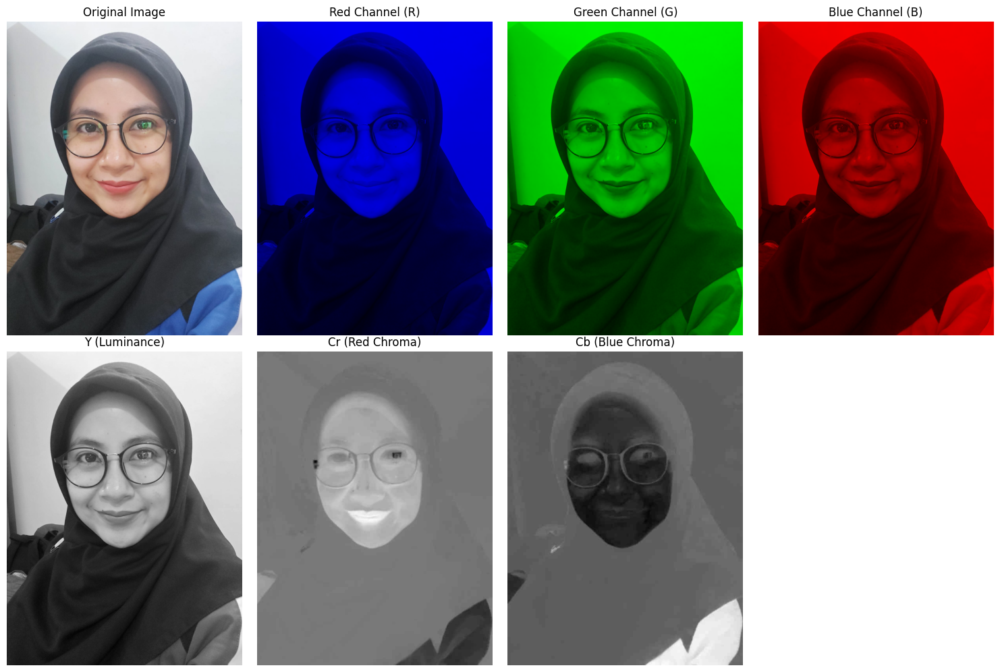

In [16]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    # Changed subplot layout to accommodate 7 images
    plt.figure(figsize=(15, 10))
    for i, (img, title) in enumerate(zip(images, titles)):
        # Adjusted subplot grid to 2 rows, 4 columns
        plt.subplot(2, 4, i + 1)  # Changed from (2, 3, i + 1)
        if cmap_type:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# **1. Pisahkan Komponen RGB**
b, g, r = cv2.split(image)

# Buat gambar untuk menampilkan warna dominan per channel
red_channel = np.zeros_like(image)
red_channel[:, :, 2] = r

green_channel = np.zeros_like(image)
green_channel[:, :, 1] = g

blue_channel = np.zeros_like(image)
blue_channel[:, :, 0] = b

# **2. Konversi ke Ruang Warna YCrCb**
ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
y, cr, cb = cv2.split(ycrcb_image)

# **3. Visualisasi**
images = [
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB),  # Original
    red_channel, green_channel, blue_channel,  # RGB Channels
    y, cr, cb  # YCrCb Channels
]
titles = [
    "Original Image",
    "Red Channel (R)", "Green Channel (G)", "Blue Channel (B)",
    "Y (Luminance)", "Cr (Red Chroma)", "Cb (Blue Chroma)"
]
show_images(images, titles, cmap_type="gray")

Saving WhatsApp Image 2021-11-02 at 15.27.20.jpeg to WhatsApp Image 2021-11-02 at 15.27.20 (6).jpeg


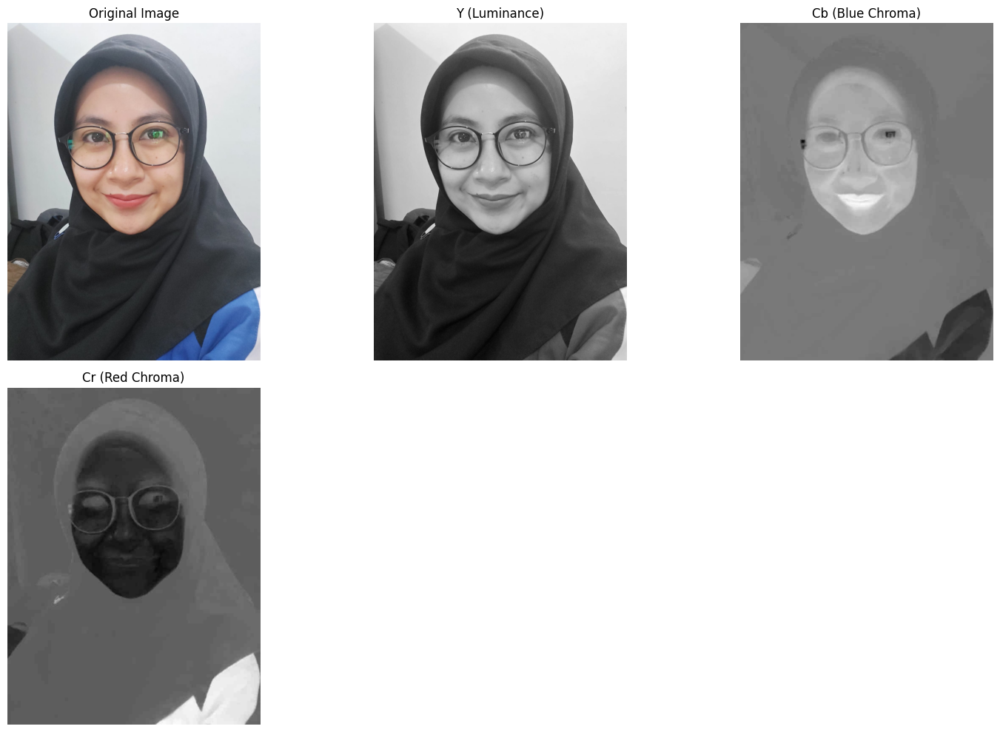

Matriks 5x5 dari channel Y (Luminance):
[[229 229 229 229 229]
 [229 229 229 229 229]
 [228 228 228 228 228]
 [228 228 228 228 228]
 [228 228 228 228 228]]

Matriks 5x5 dari channel Cb (Blue Chroma):
[[125 125 125 125 125]
 [125 125 125 125 125]
 [125 125 125 125 125]
 [125 125 125 125 125]
 [125 125 125 125 125]]

Matriks 5x5 dari channel Cr (Red Chroma):
[[131 131 131 131 131]
 [131 131 131 131 131]
 [131 131 131 131 131]
 [131 131 131 131 131]
 [131 131 131 131 131]]


In [17]:
# Install library jika diperlukan
!pip install opencv-python-headless matplotlib numpy

# Import library
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Fungsi untuk menampilkan gambar
def show_images(images, titles, cmap_type=None):
    plt.figure(figsize=(15, 10))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 3, i + 1)
        if cmap_type:
            plt.imshow(img, cmap=cmap_type)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Upload gambar
from google.colab import files
uploaded = files.upload()

# Membaca gambar
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Konversi ke ruang warna YCrCb
ycrcb_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

# Ekstrak channel Y, Cb, Cr
y, cb, cr = cv2.split(ycrcb_image)

# Tampilkan gambar
images = [
    cv2.cvtColor(image, cv2.COLOR_BGR2RGB),  # Original
    y, cb, cr  # Y, Cb, Cr
]
titles = [
    "Original Image", "Y (Luminance)", "Cb (Blue Chroma)", "Cr (Red Chroma)"
]
show_images(images, titles, cmap_type="gray")

# **Matriks 5x5 dari masing-masing channel**
print("Matriks 5x5 dari channel Y (Luminance):")
print(y[0:5, 0:5])

print("\nMatriks 5x5 dari channel Cb (Blue Chroma):")
print(cb[0:5, 0:5])

print("\nMatriks 5x5 dari channel Cr (Red Chroma):")
print(cr[0:5, 0:5])
